In [1]:
path='G:/Shared drives/BeStarsMiMeS/UpdatedFiles/' #Patrick's google file stream path

import LSDpy.lsdpy
import specpolFlow as pol


import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
import astropy.constants as const
from matplotlib.backends.backend_pdf import PdfPages
import pandas as pd
import itertools

import pyRaven as rav

In [2]:
#Accessing the google sheets

sheet_id = '1M6y1Wnsrc-w5FjUMfKaSFa_-foIDAaMe8W4lYNWnWyk'
sheet_name = 'Stars'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
StarData=pd.read_csv(url)

sheet_name = 'Observations'
url = f'https://docs.google.com/spreadsheets/d/{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
Observations=pd.read_csv(url)

## 1. Bpolegridfitting

7.700255787628462e-06 1800
Max shift due to field: 0.15114332163643193 vdop
Max shift due to vsini: 9.40641820716331 vdop
2.580684267048201e-07 700
Max shift due to field: 0.058777958414167976 vdop
Max shift due to vsini: 24.36823099398032 vdop
5.7409579524501215e-08 1000
Max shift due to field: 0.08396851202023997 vdop
Max shift due to vsini: 28.105003471696527 vdop
Max shift due to field: 0.8312882690003757 vdop
Max shift due to vsini: 26.76756658460156 vdop
1.967806210774264e-06 1800
Max shift due to field: 0.15114332163643193 vdop
Max shift due to vsini: 18.153775735402576 vdop
2.125085471988588e-06 1500
Max shift due to field: 0.12595276803035996 vdop
Max shift due to vsini: 17.639998909766913 vdop
6.024319200072829e-06 800
Max shift due to field: 0.06717480961619197 vdop
Max shift due to vsini: 11.284870476116835 vdop
2.237303035363837e-06 2600
Max shift due to field: 0.21831813125262392 vdop
Max shift due to vsini: 20.379998404966607 vdop
7.715673813632972e-07 9500
Max shift due

C:\MyPythonPackages\pyRaven\data.py:103: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(4,1)


2.073636414238466e-06 1500
Max shift due to field: 0.12595276803035996 vdop
Max shift due to vsini: 15.563479988584536 vdop
7.891125829679985e-07 3000
Max shift due to field: 0.2519055360607199 vdop
Max shift due to vsini: 25.23254902848753 vdop
2.9949009567665542e-06 2100
Max shift due to field: 0.17633387524250393 vdop
Max shift due to vsini: 15.689003371546272 vdop
1.5263630478055823e-07 2100
Max shift due to field: 0.17633387524250393 vdop
Max shift due to vsini: 27.849357244307914 vdop
1.7029001449617745e-06 2000
Max shift due to field: 0.16793702404047994 vdop
Max shift due to vsini: 19.91939639802606 vdop
8.927444578900323e-07 3200
Max shift due to field: 0.2686992384647679 vdop
Max shift due to vsini: 22.53769952647293 vdop
1.1399157083709163e-06 2600
Max shift due to field: 0.21831813125262392 vdop
Max shift due to vsini: 23.289971139873415 vdop
1.1269788488548247e-07 3400
Max shift due to field: 0.2854929408688159 vdop
Max shift due to vsini: 24.745759941200852 vdop
8.8698096

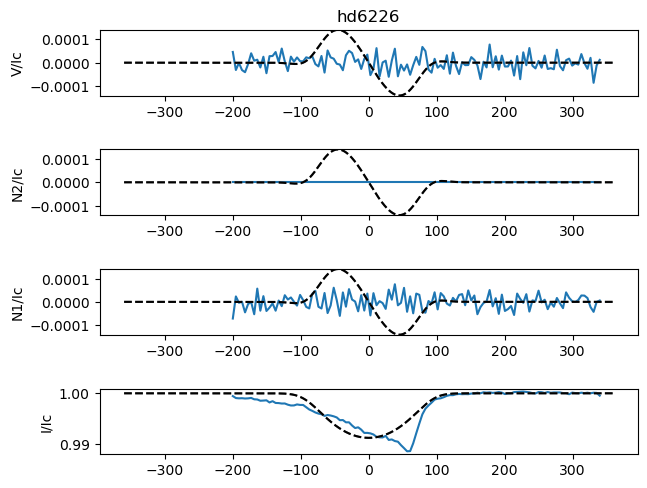

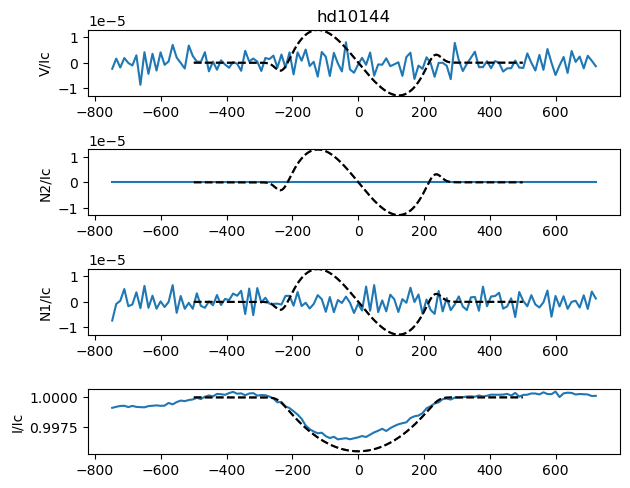

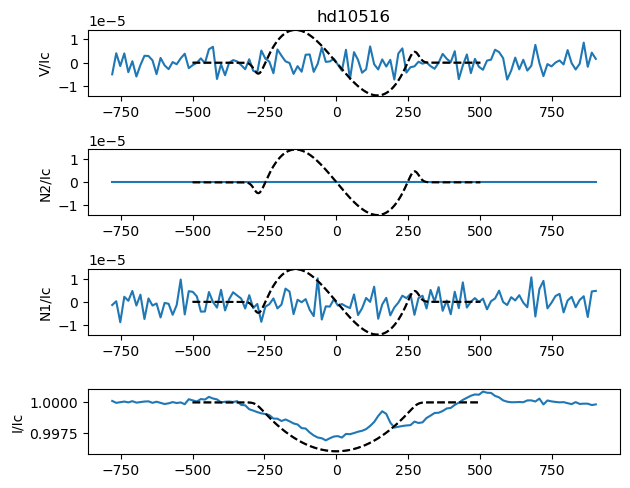

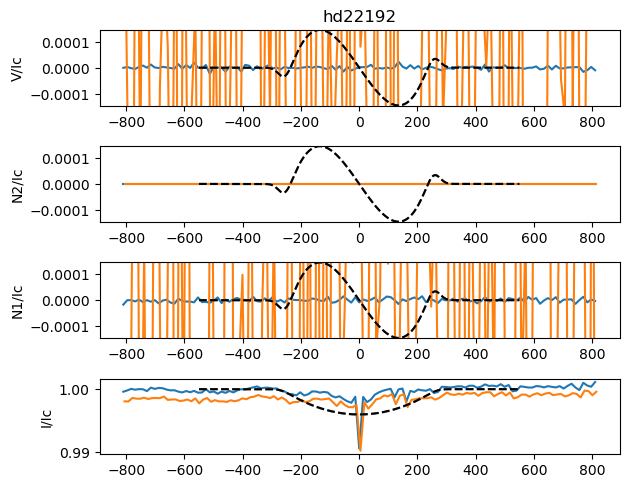

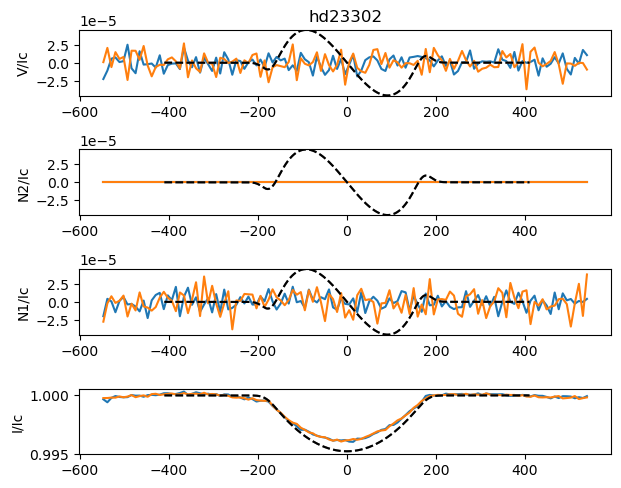

...

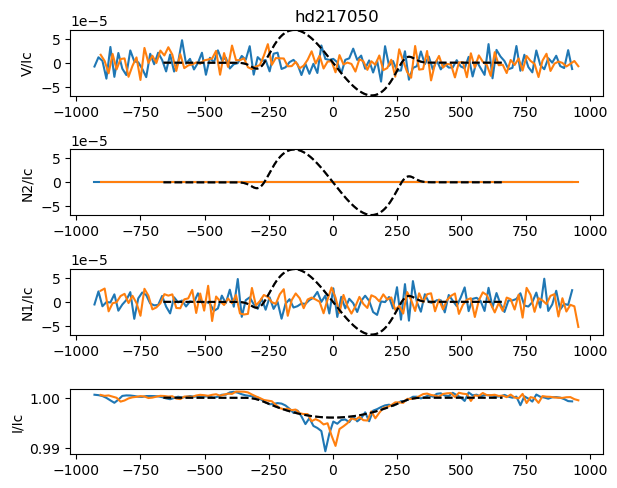

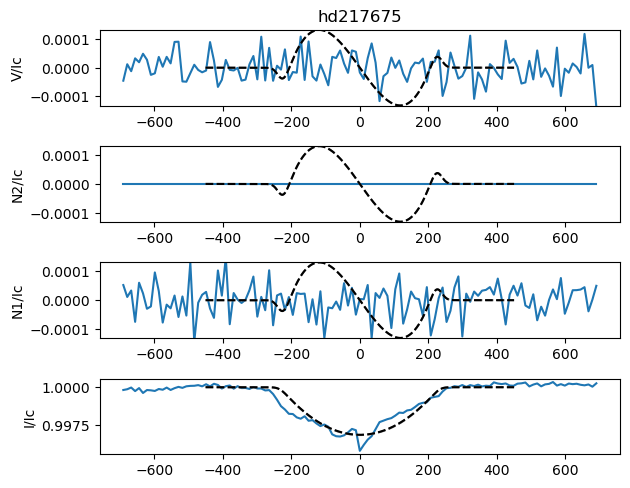

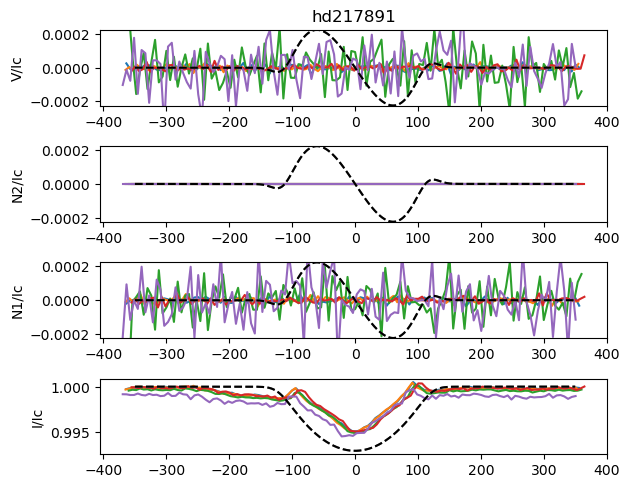

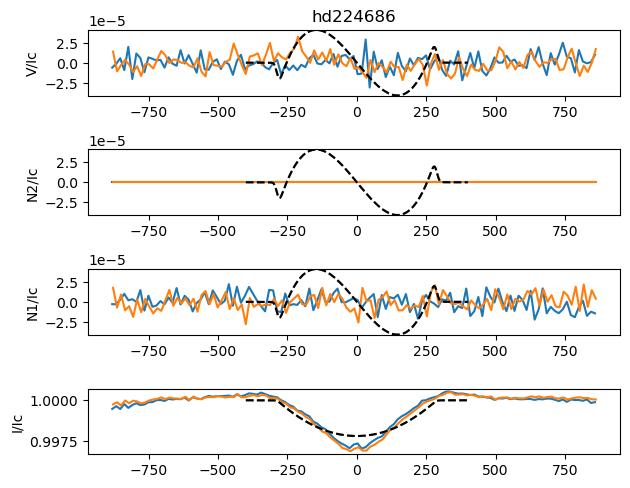

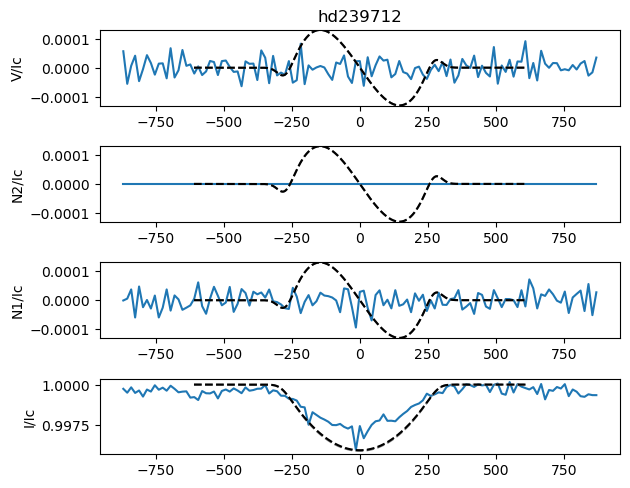

In [16]:
with PdfPages('{}05-RavenSetup/Bpolegridfitting.pdf'.format(path)) as pdf:
       for i,StarInfo in StarData.iterrows():
              if StarInfo['pyRavenFlag']==1:
                     star=StarInfo['Name']
                     param=rav.params.read_parameters('{}05-RavenSetup/params_hybrid/{}.json'.format(path,star))
                     fname_h='{}05-RavenSetup/hybrid_maskdepth0.02_tellClean/{}.h5'.format(path,star)
                     datapacket_h=rav.data.read_packet(fname_h)
                     fname_n='{}05-RavenSetup/normalized_maskdepth0.02_tellClean/{}.h5'.format(path,star)
                     datapacket_n=rav.data.read_packet(fname_n)

                     # set initial params values
                     i_min=StarData['i_min [deg]'][i]

                     param['grid'] = {
                     'Bpole_grid': np.linspace(0,5000,25),
                     'incl_grid': np.linspace(i_min,180,18),
                     'beta_grid':np.linspace(0,180,18),
                     'phase_grid':np.linspace(0,360,18*2),
                     }

                     param['unno']['up']=[0.5, 1.128, 0.5]

                     param['weak']['geff']=1.2
                     param['general']['lambda0']=5000

                     param['general']['incl']=90
                     param['general']['beta']=90
                     param['general']['phase']=0

                     #finds the std of stokes V for all observations
                     std=np.array([])
                     for j in range(datapacket_h.nobs):
                            std=np.append(std,datapacket_h.scaled.lsds[j].specV.std())
                     Vstd=std.mean()

                     #finds the Bpole corresponding to a 4*std stokes v detection
                     for j in range(0,100):
                            param['general']['Bpole']=j*100
                            model = rav.diskint2.numerical(param)
                            if model['V'].max()-Vstd*4>=0:
                                   print(model['V'].max()-Vstd*4,j*100)
                                   Bpole=j*100
                                   break
                                   
                     #makes Bpole grid
                     param['grid']['Bpole_grid'] = np.arange(0,param['general']['Bpole']+1,(param['general']['Bpole']/200))
                     
                     #makes phase grid
                     param['grid']['phase_grid'] = np.arange(0,360,5)
                     
                     #makes inclination grid
                     arr=np.arange(0,181,5)
                     param['grid']['incl_grid'] = arr[arr>=int(np.round(i_min*2,-1)/2)]
                     param['grid']['incl_grid'] = param['grid']['incl_grid'][param['grid']['incl_grid']<=int(np.round((180-i_min)*2,-1)/2)]
                     
                     #makes beta grid
                     param['grid']['beta_grid'] = np.arange(0,181,5)

                     #saves params to .json file
                     rav.params.parameters(param).write('{}05-RavenSetup/params_hybrid/{}.json'.format(path,star))

                     #plotting
                     model2 = rav.diskint2.numerical(param,True)
                     # Make a graph of the Scaled LSD profiles in the data Packet
                     fig, ax = datapacket_n.scaled.plot()
                     # Overplot the calculated model
                     ax[3].plot(model2['vel'], model2['flux'], ls='--', c='grey')
                     ax[3].plot(model['vel'], model['flux'], ls='--', c='k')
                     ax[0].set_title(star)

                     for item in ax.flatten()[0:3]:
                            item.plot(model2['vel'], model2['V'], ls='--', c='grey')
                            item.plot(model['vel'], model['V'], ls='--', c='k')
                            
                            if model['V'].max()>=model2['V'].max():
                                   item.set_ylim(model['V'].min(),model['V'].max())
                            else:
                                   item.set_ylim(model2['V'].min(),model2['V'].max())

                     pdf.savefig(fig)


6.916205101542019e-07 3200
Max shift due to field: 0.2686992384647679 vdop
Max shift due to vsini: 8.986762733336473 vdop
1.117590445573383e-06 900
Max shift due to field: 0.07557166081821597 vdop
Max shift due to vsini: 22.857691391077807 vdop
6.352417684044635e-07 2700
Max shift due to field: 0.22671498245464794 vdop
Max shift due to vsini: 33.82500170216722 vdop
Max shift due to field: 0.8312882690003757 vdop
Max shift due to vsini: 31.824890726864016 vdop
1.6575022134699153e-06 2200
Max shift due to field: 0.18473072644452793 vdop
Max shift due to vsini: 17.249435332715375 vdop
1.32054234070273e-06 2300
Max shift due to field: 0.19312757764655195 vdop
Max shift due to vsini: 15.54279981688523 vdop
1.0406965378719938e-06 2100
Max shift due to field: 0.17633387524250393 vdop
Max shift due to vsini: 9.334036078411248 vdop
6.844967550612754e-08 6200
Max shift due to field: 0.5206047745254878 vdop
Max shift due to vsini: 19.188518607070016 vdop
1.3845419316061704e-06 9900
Max shift due 

C:\MyPythonPackages\pyRaven\data.py:103: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(4,1)


5.958893304242345e-08 1700
Max shift due to field: 0.14274647043440794 vdop
Max shift due to vsini: 13.586994145056408 vdop
7.018319610029909e-07 4000
Max shift due to field: 0.3358740480809599 vdop
Max shift due to vsini: 17.008560207489616 vdop
2.427934443124938e-06 2700
Max shift due to field: 0.22671498245464794 vdop
Max shift due to vsini: 15.334760935921967 vdop
1.602942632465359e-06 2600
Max shift due to field: 0.21831813125262392 vdop
Max shift due to vsini: 23.85234692591856 vdop
7.558919604711971e-07 3600
Max shift due to field: 0.30228664327286386 vdop
Max shift due to vsini: 17.645299620609915 vdop
4.3017242868929515e-07 4500
Max shift due to field: 0.37785830409107984 vdop
Max shift due to vsini: 18.003873302490113 vdop
8.05193917897978e-07 8100
Max shift due to field: 0.6801449473639437 vdop
Max shift due to vsini: 39.999999548277515 vdop
5.893114994742901e-07 9400
Max shift due to field: 0.7893040129902557 vdop
Max shift due to vsini: 21.474921043830996 vdop
3.9965505652

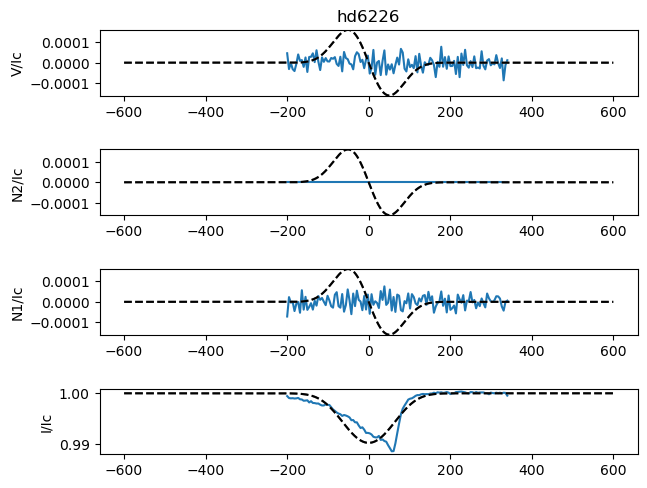

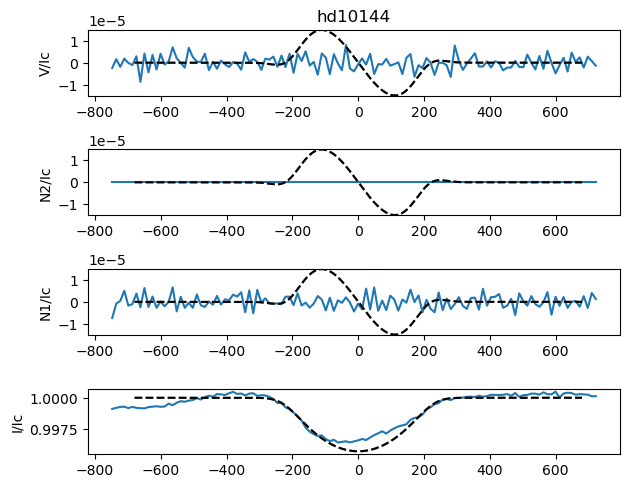

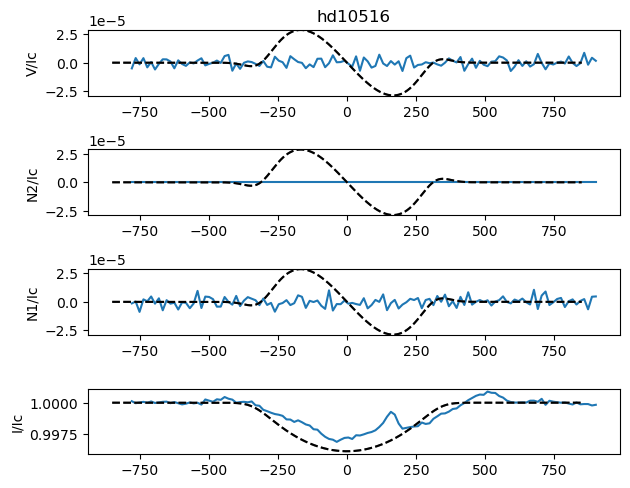

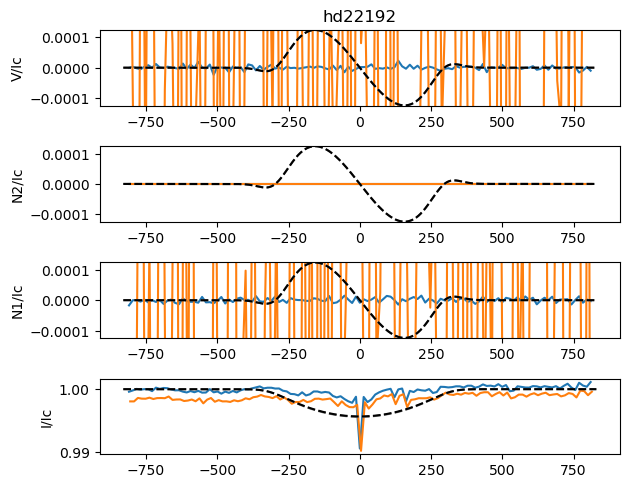

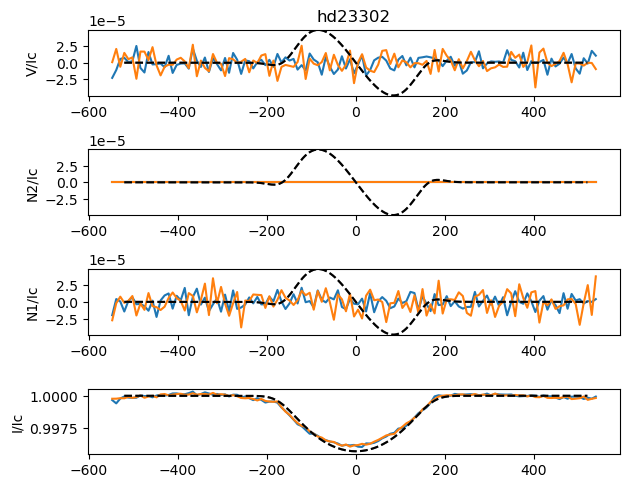

...

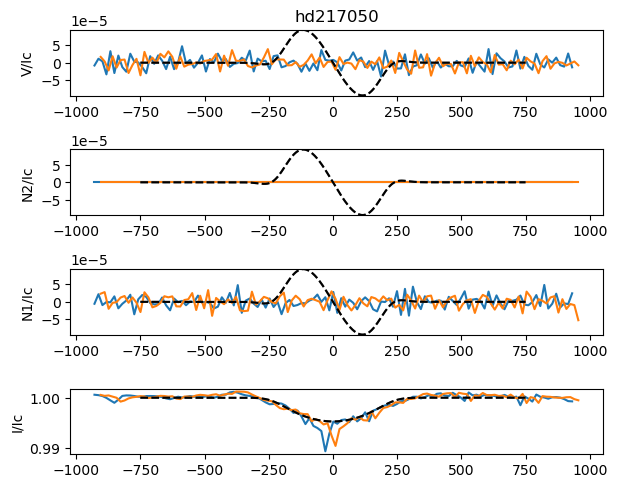

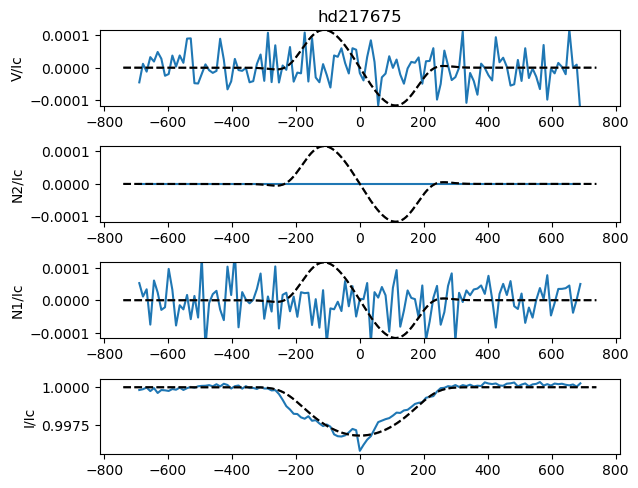

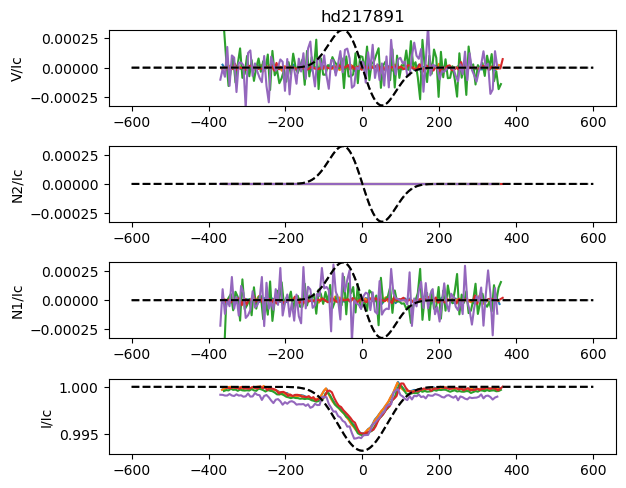

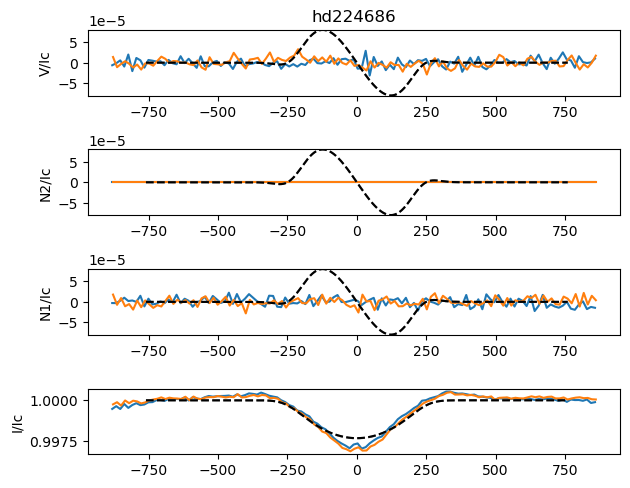

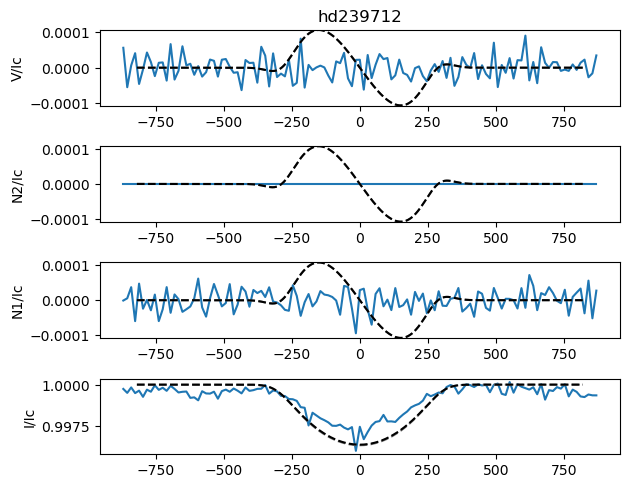

In [18]:
with PdfPages('{}05-RavenSetup/Bpolegridfitting.pdf'.format(path)) as pdf:
       for i,StarInfo in StarData.iterrows():
              if StarInfo['pyRavenFlag']==1:
                     star=StarInfo['Name']
                     param=rav.params.read_parameters('{}05-RavenSetup/params_norm/{}.json'.format(path,star))
                     fname_h='{}05-RavenSetup/normalized_SuperCleanAsif_tellClean/{}.h5'.format(path,star)
                     datapacket_h=rav.data.read_packet(fname_h)
                     fname_n='{}05-RavenSetup/normalized_maskdepth0.02_tellClean/{}.h5'.format(path,star)
                     datapacket_n=rav.data.read_packet(fname_n)

                     # set initial params values
                     i_min=StarData['i_min [deg]'][i]

                     param['grid'] = {
                     'Bpole_grid': np.linspace(0,5000,25),
                     'incl_grid': np.linspace(i_min,180,18),
                     'beta_grid':np.linspace(0,180,18),
                     'phase_grid':np.linspace(0,360,18*2),
                     }

                     param['unno']['up']=[0.5, 1.128, 0.5]

                     param['weak']['geff']=1.2
                     param['general']['lambda0']=5000

                     param['general']['incl']=90
                     param['general']['beta']=90
                     param['general']['phase']=0

                     #finds the std of stokes V for all observations
                     std=np.array([])
                     for j in range(datapacket_h.nobs):
                            std=np.append(std,datapacket_h.scaled.lsds[j].specV.std())
                     Vstd=std.mean()

                     #finds the Bpole corresponding to a 4*std stokes v detection
                     for j in range(0,100):
                            param['general']['Bpole']=j*100
                            model = rav.diskint2.numerical(param)
                            if model['V'].max()-Vstd*4>=0:
                                   print(model['V'].max()-Vstd*4,j*100)
                                   Bpole=j*100
                                   break
                                   
                     #makes Bpole grid
                     param['grid']['Bpole_grid'] = np.arange(0,param['general']['Bpole']+1,(param['general']['Bpole']/200))
                     
                     #makes phase grid
                     param['grid']['phase_grid'] = np.arange(0,360,5)
                     
                     #makes inclination grid
                     arr=np.arange(0,181,5)
                     param['grid']['incl_grid'] = arr[arr>=int(np.round(i_min*2,-1)/2)]
                     param['grid']['incl_grid'] = param['grid']['incl_grid'][param['grid']['incl_grid']<=int(np.round((180-i_min)*2,-1)/2)]
                     
                     #makes beta grid
                     param['grid']['beta_grid'] = np.arange(0,181,5)

                     #saves params to .json file
                     rav.params.parameters(param).write('{}05-RavenSetup/params_norm/{}.json'.format(path,star))

                     #plotting
                     model2 = rav.diskint2.numerical(param,True)
                     # Make a graph of the Scaled LSD profiles in the data Packet
                     fig, ax = datapacket_n.scaled.plot()
                     # Overplot the calculated model
                     ax[3].plot(model2['vel'], model2['flux'], ls='--', c='grey')
                     ax[3].plot(model['vel'], model['flux'], ls='--', c='k')
                     ax[0].set_title(star)

                     for item in ax.flatten()[0:3]:
                            item.plot(model2['vel'], model2['V'], ls='--', c='grey')
                            item.plot(model['vel'], model['V'], ls='--', c='k')
                            
                            if model['V'].max()>=model2['V'].max():
                                   item.set_ylim(model['V'].min(),model['V'].max())
                            else:
                                   item.set_ylim(model2['V'].min(),model2['V'].max())

                     pdf.savefig(fig)


Text(0.5, 1.0, 'Bpole Grid Max Value')

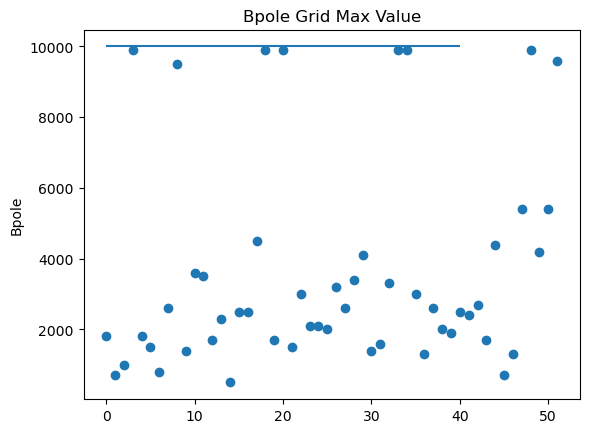

In [17]:
hist=np.array([])
for i,StarInfo in StarData.iterrows():
    if StarInfo['pyRavenFlag']==1:
            star=StarInfo['Name']
            param=rav.params.read_parameters('{}05-RavenSetup/params_hybrid/{}.json'.format(path,star))
            hist=np.append(hist,param['general']['Bpole'])
plt.scatter(range(hist.size),hist)
plt.ylabel('Bpole')
plt.hlines(10000, 0, 40)
plt.title('Bpole Grid Max Value')

## OLD

In [5]:

for i,StarInfo in StarData.iterrows():
       if StarInfo['pyRavenFlag']==StarInfo['AsifgoodFlag']==1.0:
              star=StarInfo['Name']
              param=rav.params.read_parameters('{}05-RavenSetup/params/{}.json'.format(path,star))
              fname_h='{}05-RavenSetup/hybrid_maskdepth0.02_tellClean/{}.h5'.format(path,star)
              datapacket_h=rav.data.read_packet(fname_h)
              fname_n='{}05-RavenSetup/normalized_maskdepth0.02_tellClean/{}.h5'.format(path,star)
              datapacket_n=rav.data.read_packet(fname_n)
              i_min=StarInfo['i_min [deg]']
              
              param['grid'] = {
              'Bpole_grid': np.linspace(0,5000,25),
              'incl_grid': np.linspace(i_min,180-i_min,18),
              'beta_grid':np.linspace(0,180,18),
              'phase_grid':np.linspace(0,360,18*2),
              }

              param['grid']['Bpole_grid'] = np.arange(0,param['general']['Bpole']+1,(param['general']['Bpole']/200))
              param['grid']['phase_grid'] = np.arange(0,360,5)
              
              arr=np.arange(0,181,5)
              param['grid']['incl_grid'] = arr[arr>=int(np.round(i_min*2,-1)/2)]
              param['grid']['incl_grid'] = param['grid']['incl_grid'][param['grid']['incl_grid']<=int(np.round((180-i_min)*2,-1)/2)]
              param['grid']['beta_grid'] = np.arange(0,181,5)

              rav.params.parameters(param).write('{}05-RavenSetup/params/{}.json'.format(path,star))
              